# Reinforcement Learning

This tutorial shows how to use PyTorch to train a **Deep Q-Network (DQN)** on the 
*Frozen Lake* environment, which involves crossing a frozen lake from start to 
goal without falling into any holes by walking over the frozen lake. The player may 
not always move in the intended direction due to the slippery nature of the frozen lake.

<img src="https://gymnasium.farama.org/_images/frozen_lake.gif">

In reinforcement learning, an agent learns how to behave in an environment by performing actions 
(through trial and error) and seeing the results (receiving negative or positive feedback).
The **exploration/exploitation trade-off** is an important topic in reinforcement learning methods.
An agent should exploit previously acquired information to maximise the reward. At the same time,
the agent should explore the environment to find new information.

<img src="https://www.researchgate.net/publication/37256365/figure/fig1/AS:309901357273109@1450897649794/The-reinforcement-learning-framework-in-which-an-agent-takes-a-series-of-actions-each.png" width=400>


## 0. Preparation

To run this notebook, we need to perform some preparations.

We use the *Frozen Lake* environment from the `gymnasium` package- In Google Colab you 
can install it by uncommenting and executing the following code cell.

In [1]:
#!pip install gymnasium[classic_control]

### Packages

Let's start with all the necessary packages to implement this tutorial.

 * [numpy](https://numpy.org/) is the main package for scientific computing with Python. It's often imported with the `np` shortcut.
 * [os](https://docs.python.org/3/library/os.html) provides a portable way of using operating system-dependent functionality, e.g., modifying files/folders.
 * [argparse](https://docs.python.org/3/library/argparse.html) is a module making it easy to write user-friendly command-line interfaces.
 * [cv2](https://docs.opencv.org/4.x/index.html) is a leading computer vision library.
 * [matplotlib](https://matplotlib.org/) is a library to plot graphs in Python.
 * [IPython.display](https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.html) is a library to display tools in IPython.
 * [torch](https://pytorch.org/docs/stable/index.html) is a deep learning framework that allows us to define networks, handle datasets, optimise a loss function, etc.
 * [gymnasium](https://gymnasium.farama.org/) is a standard API for reinforcement learning and a diverse collection of reference environments.

In [2]:
import numpy as np
import os
import argparse
import random
from itertools import count
from collections import namedtuple, deque

import cv2
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import IPython.display as ipd

import torch
from torch import nn
import gymnasium as gym

### device
Choosing CPU or GPU based on the availability of the hardware.

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Selected device:', device)

Selected device: cuda


### arguments

We use the `argparse` module to define a set of parameters that we use throughout this notebook:
* The `argparse` is particularly useful when writing Python scripts, allowing you to run the same script with different parameters (e.g., for doing different experiments).
* In notebooks, using `argparse` is not necessarily beneficial. We could have hard-coded those values directly in variables, but here we use `argparse` for three reasons:
    * Learning purposes
    * Making the code more modular
    * Facilitating the process of conducting different experiments

In [31]:
parser = argparse.ArgumentParser()
parser.add_argument("--episodes", type=int, default=2000, help="number of training episodes")
parser.add_argument("--batch_size", type=int, default=128, help="the number of transitions sampled from the replay buffer")
parser.add_argument("--n_runs", type=int, default=20, help="Number of runs")

parser.add_argument("--lr", type=float, default=1e-3, help="Learning rate")
parser.add_argument("--gamma", type=float, default=0.95, help="Discounting rate")
parser.add_argument("--tau", type=float, default=0.005, help="target network update rate")
parser.add_argument("--max_eps", type=float, default=1.0, help="Maximum value of epsilon")
parser.add_argument("--min_eps", type=float, default=0.01, help="Minimum value of epsilon")
parser.add_argument("--eps_decay", type=float, default=1e-3, help="exponential decay of epsilon")
parser.add_argument("--embedding_dim", type=float, default=256, help="Network's embedding size")

parser.add_argument("--log_frequency", type=int, default=100, help="interval between log prints")
parser.add_argument("--out_dir", type=str, default="./out/dqn_out/", help="the output directory")

def set_args(*args):
    # we can pass arguments to the parse_args function to change the default values. 
    opt = parser.parse_args([*args])
    # setting the device
    opt.device = device
    # creating the output directory
    os.makedirs(opt.out_dir, exist_ok=True)
    return opt

## 1. Environment

In this tutorial, we use the [Frozen Lake environment](https://gymnasium.farama.org/environments/toy_text/frozen_lake/)
that occurs over a grid world of size $W \times H$. We construct a small $4 \times 4$ map.

The game starts with the player at location `[0,0]` of the frozen lake grid world with 
the goal located at the far extent of the world, e.g., `[3,3]` for the $4 \times 4$ environment.

At each time step, the player can take one of the following four actions:

0. Move left
1. Move down
2. Move right
3. Move up

When `is_slippery=True`, the player will move in the intended direction with a probability of $\frac{1}{3}$ else will move in either perpendicular direction with an equal probability of $\frac{1}{3}$ in both directions.

For example, if action is left ($\leftarrow$) and `is_slippery=True`, then:
* $P(\leftarrow)=\frac{1}{3}$
* $P(\uparrow)=\frac{1}{3}$
* $P(\downarrow)=\frac{1}{3}$

The environment returns the following rewards:
* Reach goal: +1
* Reach hole: 0
* Reach frozen: 0

The game ends when:
1. The player falls into a hole :(
2. The player reaches the goal :)



### Creation

Let's create an instance of our word and take some random actions to familiarise
ourselves with the game.

One can easily change the environment settings. For instance, the `map_name` variable controls the environment size.

In [63]:
env = gym.make("FrozenLake-v1", desc=None, map_name="4x4", is_slippery=True, render_mode="rgb_array")
_ = env.reset()

In [6]:
print('Environment state size: %d' % env.observation_space.n)
print('Environment action size: %d' % env.action_space.n)

Environment state size: 16
Environment action size: 4


### Random steps
Let's make 100 random steps to see how far our agent gets!

In [7]:
env_rendered_imgs = []
for _ in range(100):
    # get the current map
    env_img = env.render()
    # resize it to a smaller resolution and add it to the list
    env_rendered_imgs.append(cv2.resize(env_img, (0, 0), fx=0.7, fy=0.7))
    # take a random action
    env.step(env.action_space.sample())

In the interactive panel below, we can see that our agent falls into a 
frozen lake after a few random steps.

In [8]:
fig = plt.figure(figsize=(5, 4))
plt.axis("off")
imgs_map = [[plt.imshow(img_i, animated=True)] for img_i in env_rendered_imgs]
animated_map = animation.ArtistAnimation(fig, imgs_map, interval=1000, repeat_delay=1000, blit=True)
plt.close('all')
ipd.HTML(animated_map.to_jshtml())

It is not surprising that random steps results in falling into frozen lakes.
We need an intelligent agent to solve this task! To do so, we design a neural network.

## 2. Network

We use **Deep Q-Learning** in this tutorial and our neural network (DQN) aims to learn a policy that 
maximises the discounted, cumulative reward
$R_{t_0} = \sum_{t=t_0}^{\infty} \gamma^{t - t_0} r_t$, where
$R_{t_0}$ is also known as the *return*:
 * The discount, $\gamma$, should be a constant between $0$ and $1$
that ensures the sum converges.
 * A lower $\gamma$ prioritises near-future awards than far-future ones.

The main idea behind Q-learning is that if we had a function
$Q^*: State \times Action \rightarrow \mathbb{R}$, that could tell
us what would be the action's reward in a given
state, then we could easily construct a policy that maximises our
rewards:

\begin{align}\pi^*(s) = \arg\!\max_a \ Q^*(s, a)\end{align}

However, the network does not have direct access to $Q^*$ (it does not know everything about the world). 
Therefore, we use neural networks as universal function
approximators to create $\hat{Q}^*$ that resembles the true $Q^*$.

### Experience Replay

The DQN uses the *experience replay*, a biologically inspired mechanism that uses a 
random sample of prior actions instead of the most recent action to proceed. To do so, 
we need to store the transitions that the agent observes, allowing us to reuse this data
later. By sampling from it randomly, the transitions that build up a batch are decorrelated.
It has been shown that this greatly stabilises and improves the DQN training procedure.

For this, we define two classes:
 * ``Transition`` – a named tuple representing a single transition in the environment.
   It essentially maps `(state, action)` pairs to their `(next_state, reward)` result,
   with the state being the screen difference image as described later on.
 *  ``ExperienceReplay`` – a cyclic buffer of bounded size that holds the
   transitions observed recently. It also implements a ``.sample()``
   method for selecting a random batch of transitions for training.

In [9]:
# Named tuples assign meaning to each position in a tuple and allow for 
# more readable, self-documenting code
Transition = namedtuple('Transition', ('state', 'action', 'next_state', 'reward'))

class ExperienceReplay(object):

    def __init__(self, capacity):
        self.memory = deque([], maxlen=capacity)

    def push(self, *args):
        """Save a transition"""
        self.memory.append(Transition(*args))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

Let's make a `memory` for 10 random actions and print a few samples of it.

In [56]:
memory = ExperienceReplay(10)
state, info = env.reset()
for _ in range(10):
    action = env.action_space.sample()
    next_state, reward, terminated, truncated, _ = env.step(action.item())
    memory.push(state, action, next_state, reward)
print("Number of items in memory: %d" % len(memory))
# the sample function returns a list of Transition object
samples = memory.sample(3)
print("Number of read samples from memory: %d" % len(samples))
print("Sample 0:", samples[0])
for sample in samples:
    print(
        "In state %d, doing action %d, moves the agent to state %d with reward %d!" %
        (sample.state, sample.action, sample.next_state, sample.reward)
    )

Number of items in memory: 10
Number of read samples from memory: 3
Sample 0: Transition(state=0, action=3, next_state=1, reward=0.0)
In state 0, doing action 3, moves the agent to state 1 with reward 0!
In state 0, doing action 1, moves the agent to state 8 with reward 0!
In state 0, doing action 0, moves the agent to state 4 with reward 0!


### Deep Q-Network (DQN)

We define a simple `DQN` network consisting of three blocks of `Linear` and `ReLU` layers:
* The *input* to our network is a vector of 16 elements corresponding to the
  environment state size.
  All elements of this vector are set to 0 except the current state which is 1.
* The *output* of our network is a vector of 4 elements corresponding to the
  environment action size (going left, right, up and down).

In [64]:
class DQN(nn.Module):

    def __init__(self, state_size, action_size, embedding_dim):
        super().__init__()
        self.layer1 = nn.Linear(state_size, embedding_dim)
        self.relu1 = nn.ReLU()
        self.layer2 = nn.Linear(embedding_dim, embedding_dim)
        self.relu2 = nn.ReLU()
        self.layer3 = nn.Linear(embedding_dim, action_size)

    def forward(self, x):
        x = self.layer1(x)
        x = self.relu1(x)
        x = self.layer2(x)
        x = self.relu2(x)
        return self.layer3(x)

### Agent

We define an `Agent` module to facilitate the training process:
* The `Agent` contains two `DQN` instances, `policy_net` and `target_net`.
* During the training, the `policy_net` tries different actions and soft updates
  the `target_net` to ensure **catastrophic forgetting** does not occur.
* The `target_net` is the network that we use at the test time.

Our `Agent` contains two functions:
* `select_action` which implements the exploration/exploitation of the environment.
  A larger value of `epsilon` means that the agent randomly explores the action space at a higher rate.
* `predict` which is used at test time to decide which action to take given a state.

In [23]:
class Agent(nn.Module):

    def __init__(self, env, args):
        super().__init__()
        self.device = args.device
        self.steps_done = 0
        self.epsilon = 1.0
        self.max_eps = args.max_eps
        self.min_eps = args.min_eps
        self.eps_decay = args.eps_decay

        state_size = env.observation_space.n
        self.action_size = env.action_space.n
        self.policy_net = DQN(state_size, self.action_size, args.embedding_dim).to(self.device)
        self.target_net = DQN(state_size, self.action_size, args.embedding_dim).to(self.device)
        self.target_net.load_state_dict(self.policy_net.state_dict())

        self.memory = ExperienceReplay(2500)

    def select_action(self, state):
        self.epsilon = self.min_eps + (self.max_eps - self.min_eps) * np.exp(-self.steps_done * self.eps_decay)
        self.steps_done += 1
        if random.random() > self.epsilon:
            with torch.no_grad():
                # t.max(1) will return the largest column value of each row.
                # the second column on the max result is the index of where the max 
                # element was found, so we pick an action with the larger expected reward.
                return self.policy_net(state).max(1)[1].view(1, 1)
        else:
            return torch.tensor([[np.random.randint(0, self.action_size)]], device=self.device, dtype=torch.long)

    def predict(self, state):
        return torch.argmax(self.target_net(state))

## 3. Train/test routines

The following routines are used to train/test our `DQN`.

### Utility functions

We implement two utility functions:
* `onehot_array` converts the state index into one-hot-array where are cells
  are set to 0 except for the cell corresponding to the state index which is set to 1.
* `plot_with_moving_average` plots the raw results and its moving average.

In [ ]:
def onehot_array(state, state_size, device):
    onehot_state = np.zeros(state_size)
    onehot_state[state] = 1
    onehot_state = np.reshape(onehot_state, [1, state_size])  
    onehot_state = torch.tensor(onehot_state, dtype=torch.float32, device=device)
    return onehot_state

def plot_with_moving_average(data, title, w=None, fmt='-'):
    data = np.array(data)
    if w is None:
        w = np.maximum(len(data) // 20, 2)
    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(data, fmt, label='Raw data')
    moving_average = np.convolve(data, np.ones(w), mode='valid') / w
    ax.plot(np.arange(w-1, data.shape[0]), moving_average, label='Moving average')
    ax.set_title(title, size=22)
    ax.legend(fontsize=22)

### Training loop

We have implemented the training procedure in the `episode_loop` function which 
consists of the following steps:
1. **Choose random/policy action** – Actions are chosen either randomly or
   based on a policy, see the `select_action` function in the `Agent` class.
2. **Sample the environment** – Performing the action in the environment and
   observing the results, see the `env.step` function.
3. **Store the transition in the memory** – Calling the `agent.memory.push` function.
4. **Optimise** – Run the optimisation step on every iteration. 
   Optimisation picks a random batch from the memory to do training on the new policy.
   The "older" `target_net` is used in optimisation to compute the expected $Q$ values.
   See the `optimise_model` function.
5. **Soft update the `target_net`** – the weights from the `policy_net` is used
   to update the `target_net` with the `tau` update rate.

The `optimise_model` function that performs a single step of the optimisation.

In [24]:
def optimise_model(agent, optimiser, criterion, args):
    # wait till there are some actions in the memory
    if len(agent.memory) < args.batch_size:
        return None
    transitions = agent.memory.sample(args.batch_size)
    # Transpose the batch (see https://stackoverflow.com/a/19343/3343043 for
    # detailed explanation). This converts batch-array of Transitions
    # to Transition of batch-arrays.
    batch = Transition(*zip(*transitions))

    # Compute a mask of non-final states and concatenate the batch elements
    # (a final state would've been the one after which the simulation ended)
    non_final_mask = torch.tensor(
        tuple(map(lambda s: s is not None, batch.next_state)), 
        device=args.device, dtype=torch.bool
    )
    non_final_next_states = torch.cat([s for s in batch.next_state if s is not None])
    state_batch = torch.cat(batch.state)
    action_batch = torch.cat(batch.action)
    reward_batch = torch.cat(batch.reward)

    # Compute Q(s_t, a) - the model computes Q(s_t), then we select the
    # columns of actions taken. These are the actions which would've been taken
    # for each batch state according to policy_net
    state_action_values = agent.policy_net(state_batch).gather(1, action_batch)

    # Compute V(s_{t+1}) for all next states.
    # Expected values of actions for non_final_next_states are computed based
    # on the "older" target_net; selecting their best reward with max(1)[0].
    # This is merged based on the mask, such that we'll have either the expected
    # state value or 0 in case the state was final.
    next_state_values = torch.zeros(args.batch_size, device=args.device)
    with torch.no_grad():
        next_state_values[non_final_mask] = agent.target_net(non_final_next_states).max(1)[0]
    # Compute the expected Q values
    expected_state_action_values = (next_state_values * args.gamma) + reward_batch

    loss = criterion(state_action_values, expected_state_action_values.unsqueeze(1))

    # Optimize the model
    optimiser.zero_grad()
    loss.backward()
    # In-place gradient clipping
    torch.nn.utils.clip_grad_value_(agent.policy_net.parameters(), 100)
    optimiser.step()
    return loss

The `episode_loop` function plays one complete episode of the game. It terminates
either when the agent has reached the goal or fallen into a lake.

In [36]:
def episode_loop(agent, env, criterion, optimiser, device):
    logs = {
        'durations': [],
        'rewards': [],
        'epsilons': []
    }

    state_size = env.observation_space.n
    state, info = env.reset()
    state = onehot_array(state, state_size, device)
    for t in count():
        # 1. Choose random/policy action
        action = agent.select_action(state)
        # 2. Sample the environment
        observation, reward, terminated, truncated, _ = env.step(action.item())
        reward = torch.tensor([reward], device=device)
        done = terminated or truncated

        next_state = None if terminated else onehot_array(observation, state_size, device)            

        # 3. Store the transition in the memory
        agent.memory.push(state, action, next_state, reward)

        # Move to the next state
        state = next_state

        # 4. Optimise
        # Perform one step of the optimization (on the policy network)
        loss = optimise_model(agent, optimiser, criterion, args)

        # 5. Soft update of the target network's weights
        # θ′ ← τ θ + (1 −τ )θ′
        target_net_state_dict = agent.target_net.state_dict()
        policy_net_state_dict = agent.policy_net.state_dict()
        for key in policy_net_state_dict:
            target_net_state_dict[key] = policy_net_state_dict[key]*args.tau + target_net_state_dict[key]*(1-args.tau)
        agent.target_net.load_state_dict(target_net_state_dict)

        if done:
            logs['durations'].append(t + 1)
            logs['rewards'].append(reward.item())
            logs['epsilons'].append(agent.epsilon)
            break
    return logs

Finally, we can use the `main` function to train our network.

In [ ]:
def main(args):
    agent = Agent(env, args)
    
    optimiser = torch.optim.Adam(agent.policy_net.parameters(), lr=args.lr)
    criterion = nn.MSELoss().to(args.device)
    
    logs = {
        'durations': [],
        'rewards': [],
        'epsilons': []
    }
    
    for episode_num in range(args.episodes):
        episode_log = episode_loop(agent, env, criterion, optimiser, device)
        for key in logs.keys():
            logs[key].extend(episode_log[key])
        if episode_num % args.log_frequency == 0 and episode_num > 0:
            print(
                'Episode [%.5d/%.5d] \tduration=%d\treward=%0.2f\tepsilon=%0.4f' % (
                    episode_num, args.episodes, np.mean(logs['durations']),
                    np.mean(logs['rewards']), np.mean(logs['epsilons'])
                )
            )
    
    print('Complete')
    return agent, logs

Let's train our network for 5000 episodes.

In [46]:
args = set_args("--episodes", "5000")
print(args)
agent, train_logs = main(args)

Namespace(episodes=5000, batch_size=128, n_runs=20, lr=0.001, gamma=0.95, tau=0.005, max_eps=1.0, min_eps=0.01, eps_decay=0.001, embedding_dim=256, log_frequency=100, out_dir='./out/dqn_out/', device=device(type='cuda'))
Episode [00100/05000] 	duration=8	reward=0.04	epsilon=0.6791
Episode [00200/05000] 	duration=8	reward=0.03	epsilon=0.4923
Episode [00300/05000] 	duration=9	reward=0.03	epsilon=0.3724
Episode [00400/05000] 	duration=12	reward=0.10	epsilon=0.2881
Episode [00500/05000] 	duration=16	reward=0.18	epsilon=0.2330
Episode [00600/05000] 	duration=20	reward=0.26	epsilon=0.1959
Episode [00700/05000] 	duration=22	reward=0.32	epsilon=0.1694
Episode [00800/05000] 	duration=23	reward=0.35	epsilon=0.1495
Episode [00900/05000] 	duration=24	reward=0.37	epsilon=0.1340
Episode [01000/05000] 	duration=25	reward=0.40	epsilon=0.1216
Episode [01100/05000] 	duration=26	reward=0.41	epsilon=0.1115
Episode [01200/05000] 	duration=27	reward=0.42	epsilon=0.1030
Episode [01300/05000] 	duration=27	rew

#### Results

Let's plot the results and interpret them:
* We can notice that the `durations` at the start is a small number and
  meaning that the agent was falling into one of the frozen lakes.
  As the training episodes progress, the agent learns better to play the game
  `durations` stabilises at 33 actions.
* Similarly the `rewards` (equivalent to *winning rate*) is a small number
  at the start and reaches 0.53 towards the end. **Question** What is the maximum
  theoretical winning rate in this game when `is_slippery=True`?
* The value of `epsilon` reduces steadily as the training procedure progress,
  suggesting the agent takes less random actions and relies on the learnt policy.

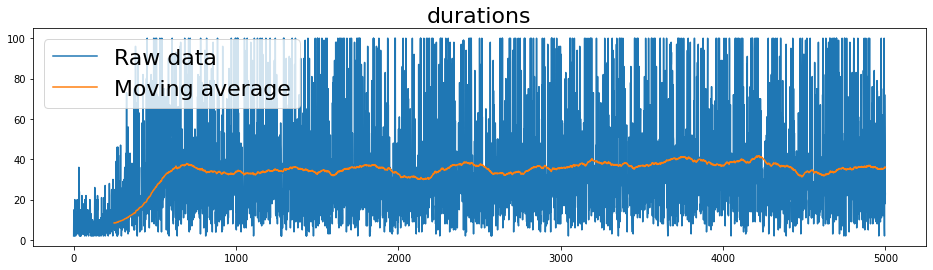

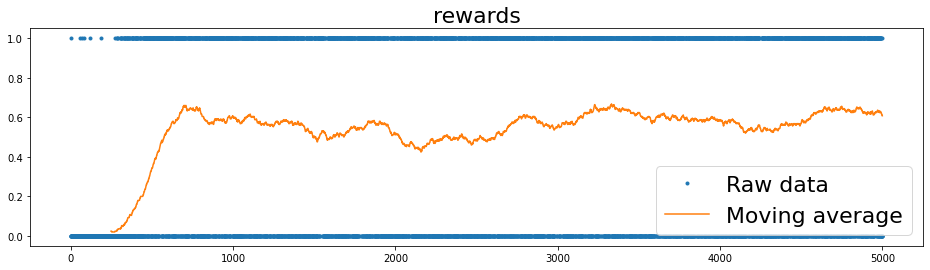

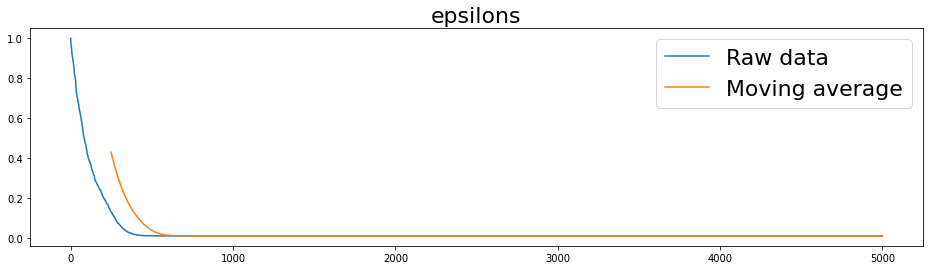

In [47]:
for key, val in train_logs.items():
    fmt = '.' if key == 'rewards' else '-'
    plot_with_moving_average(val, key, fmt=fmt)

### Testing

We have implemented the `test_agent` function that tests the network for 
the given number of `episodes`. It's important to rely on several testing
episodes to ensure the obtained results are not obtained by chance.

In [48]:
def test_agent(agent, env, episodes, device):
    logs = {
        'durations': [],
        'rewards': [],
    }
    
    state_size = env.observation_space.n
    with torch.no_grad():
        for _ in range(episodes):
            state, info = env.reset()
            state = onehot_array(state, state_size, device)
            for t in count():
                action = agent.predict(state).detach().cpu()
                observation, reward, terminated, truncated, _ = env.step(action.item())
                done = terminated or truncated
        
                if done:
                    logs['durations'].append(t + 1)
                    logs['rewards'].append(reward)
                    break
                else:
                    # Move to the next state
                    state = None if terminated else onehot_array(observation, state_size, device)
    return logs

#### Results

Finally, we test our network for 1000 episodes.

We can observe that it reaches a $63\%$ winning rate.
**Question** What is the maximum theoretical winning rate in this game when `is_slippery=True`?

In [49]:
test_logs = test_agent(agent, env, 1000, args.device)
print('Test win rate: %.2f' % np.mean(test_logs['rewards']))

Test win rate: 0.63


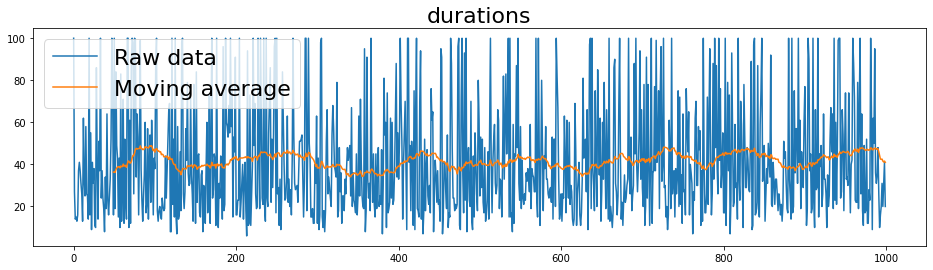

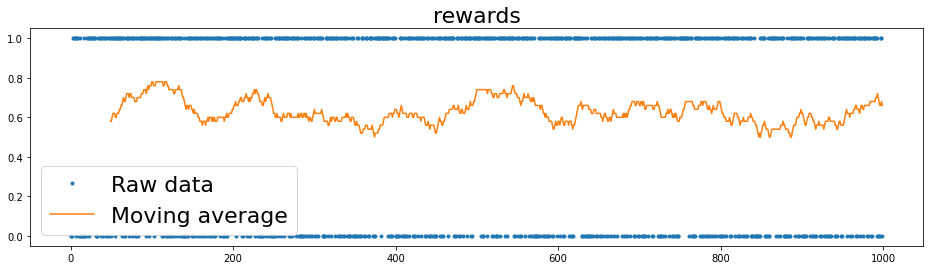

In [50]:
for key, val in test_logs.items():
    fmt = '.' if key == 'rewards' else '-'
    plot_with_moving_average(val, key, fmt=fmt)

## Excercises
Below is a list of exercises to practice what we have learnt in this notebook:

1. Try a bigger grid (e.g., $7 \times 7$). Does the agent learn a bigger environment easily?
2. Test the network with an environment where `is_slippery=False`. How does the performance change?

## References
The following sources inspire the materials in this notebook:
* [Gymnasium Frozen lake Benchmark](https://gymnasium.farama.org/tutorials/training_agents/FrozenLake_tuto/)
* [Pytorch DQN Tutorial](https://pytorch.org/tutorials/intermediate/reinforcement_q_learning.html)
* [Hugging Face Deep Reinforcement Learning Course](https://huggingface.co/learn/deep-rl-course)